In [1]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline 
import seaborn as sns
import numpy as np

In [2]:
df = pd.read_csv("C:/Users/Pritam Laskar/Documents/PGCM - DA/Term II/Term II Study Materials/204 Logistic Regression/204 Case  Decision Tree Employee Attrition/ML+02+Classification+Employee+Attrition+Dataset.csv")

In [3]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [4]:
df.shape

(1470, 35)

In [5]:
df.duplicated().sum()

0

In [6]:
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

# Data Cleaning

In [8]:
df.select_dtypes(include = 'object')

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime
0,Yes,Travel_Rarely,Sales,Life Sciences,Female,Sales Executive,Single,Y,Yes
1,No,Travel_Frequently,Research & Development,Life Sciences,Male,Research Scientist,Married,Y,No
2,Yes,Travel_Rarely,Research & Development,Other,Male,Laboratory Technician,Single,Y,Yes
3,No,Travel_Frequently,Research & Development,Life Sciences,Female,Research Scientist,Married,Y,Yes
4,No,Travel_Rarely,Research & Development,Medical,Male,Laboratory Technician,Married,Y,No
...,...,...,...,...,...,...,...,...,...
1465,No,Travel_Frequently,Research & Development,Medical,Male,Laboratory Technician,Married,Y,No
1466,No,Travel_Rarely,Research & Development,Medical,Male,Healthcare Representative,Married,Y,No
1467,No,Travel_Rarely,Research & Development,Life Sciences,Male,Manufacturing Director,Married,Y,Yes
1468,No,Travel_Frequently,Sales,Medical,Male,Sales Executive,Married,Y,No


In [9]:
df['Attrition'].unique()

array(['Yes', 'No'], dtype=object)

In [10]:
df['BusinessTravel'].unique()

array(['Travel_Rarely', 'Travel_Frequently', 'Non-Travel'], dtype=object)

In [11]:
df['Department'].unique()

array(['Sales', 'Research & Development', 'Human Resources'], dtype=object)

In [12]:
df['EducationField'].unique()

array(['Life Sciences', 'Other', 'Medical', 'Marketing',
       'Technical Degree', 'Human Resources'], dtype=object)

In [13]:
df['EducationField'].value_counts()

Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: EducationField, dtype: int64

In [14]:
df['Gender'].unique()

array(['Female', 'Male'], dtype=object)

In [15]:
df['JobRole'].unique()

array(['Sales Executive', 'Research Scientist', 'Laboratory Technician',
       'Manufacturing Director', 'Healthcare Representative', 'Manager',
       'Sales Representative', 'Research Director', 'Human Resources'],
      dtype=object)

In [16]:
df['JobRole'].value_counts()

Sales Executive              326
Research Scientist           292
Laboratory Technician        259
Manufacturing Director       145
Healthcare Representative    131
Manager                      102
Sales Representative          83
Research Director             80
Human Resources               52
Name: JobRole, dtype: int64

In [17]:
job_role = df['JobRole'].value_counts(ascending = False)
job_role_under100 = job_role[job_role < 100]

In [18]:
def handle_job_role(value):
    if(value in job_role_under100):
        return 'Other'
    else:
        return value
    
df['JobRole'] = df['JobRole'].apply(handle_job_role)

df['JobRole'].value_counts()

Sales Executive              326
Research Scientist           292
Laboratory Technician        259
Other                        215
Manufacturing Director       145
Healthcare Representative    131
Manager                      102
Name: JobRole, dtype: int64

In [19]:
df['MaritalStatus'].unique()

array(['Single', 'Married', 'Divorced'], dtype=object)

In [20]:
df['MaritalStatus'].value_counts()

Married     673
Single      470
Divorced    327
Name: MaritalStatus, dtype: int64

In [21]:
df['Over18'].unique()

array(['Y'], dtype=object)

In [22]:
df['Over18'].value_counts()

Y    1470
Name: Over18, dtype: int64

In [23]:
# Since all employees are over 18, we will delete this column
df.drop(['Over18'], axis = 1, inplace = True)

In [24]:
df['OverTime'].unique()

array(['Yes', 'No'], dtype=object)

In [25]:
pd.set_option('display.max_columns', 100)
df.select_dtypes(exclude = 'object')


,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1102,1,2,1,1,2,94,3,2,4,5993,19479,8,11,3,1,80,0,8,0,1,6,4,0,5
1,49,279,8,1,1,2,3,61,2,2,2,5130,24907,1,23,4,4,80,1,10,3,3,10,7,1,7
2,37,1373,2,2,1,4,4,92,2,1,3,2090,2396,6,15,3,2,80,0,7,3,3,0,0,0,0
3,33,1392,3,4,1,5,4,56,3,1,3,2909,23159,1,11,3,3,80,0,8,3,3,8,7,3,0
4,27,591,2,1,1,7,1,40,3,1,2,3468,16632,9,12,3,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,884,23,2,1,2061,3,41,4,2,4,2571,12290,4,17,3,3,80,1,17,3,3,5,2,0,3
1466,39,613,6,1,1,2062,4,42,2,3,1,9991,21457,4,15,3,1,80,1,9,5,3,7,7,1,7
1467,27,155,4,3,1,2064,2,87,4,2,2,6142,5174,1,20,4,2,80,1,6,0,3,6,2,0,3
1468,49,1023,2,3,1,2065,4,63,2,2,2,5390,13243,2,14,3,4,80,0,17,3,2,9,6,0,8


In [26]:
df['Age'].unique()

array([41, 49, 37, 33, 27, 32, 59, 30, 38, 36, 35, 29, 31, 34, 28, 22, 53,
       24, 21, 42, 44, 46, 39, 43, 50, 26, 48, 55, 45, 56, 23, 51, 40, 54,
       58, 20, 25, 19, 57, 52, 47, 18, 60], dtype=int64)

In [27]:
df['DailyRate'].unique()

array([1102,  279, 1373, 1392,  591, 1005, 1324, 1358,  216, 1299,  809,
        153,  670, 1346,  103, 1389,  334, 1123, 1219,  371,  673, 1218,
        419,  391,  699, 1282, 1125,  691,  477,  705,  924, 1459,  125,
        895,  813, 1273,  869,  890,  852, 1141,  464, 1240, 1357,  994,
        721, 1360, 1065,  408, 1211, 1229,  626, 1434, 1488, 1097, 1443,
        515,  853, 1142,  655, 1115,  427,  653,  989, 1435, 1223,  836,
       1195, 1339,  664,  318, 1225, 1328, 1082,  548,  132,  746,  776,
        193,  397,  945, 1214,  111,  573, 1153, 1400,  541,  432,  288,
        669,  530,  632, 1334,  638, 1093, 1217, 1353,  120,  682,  489,
        807,  827,  871,  665, 1040, 1420,  240, 1280,  534, 1456,  658,
        142, 1127, 1031, 1189, 1354, 1467,  922,  394, 1312,  750,  441,
        684,  249,  841,  147,  528,  594,  470,  957,  542,  802, 1355,
       1150, 1329,  959, 1033, 1316,  364,  438,  689,  201, 1427,  857,
        933, 1181, 1395,  662, 1436,  194,  967, 14

In [28]:
df['DistanceFromHome'].unique()

array([ 1,  8,  2,  3, 24, 23, 27, 16, 15, 26, 19, 21,  5, 11,  9,  7,  6,
       10,  4, 25, 12, 18, 29, 22, 14, 20, 28, 17, 13], dtype=int64)

In [29]:
df['Education'].unique()

array([2, 1, 4, 3, 5], dtype=int64)

In [30]:
df['EmployeeCount'].unique()

array([1], dtype=int64)

In [31]:
# Since all employee count is 1, we will drop this column
df.drop(['EmployeeCount'], axis = 1, inplace = True)

In [32]:
df['EmployeeNumber'].unique()

array([   1,    2,    4, ..., 2064, 2065, 2068], dtype=int64)

In [33]:
df['MonthlyIncome'].unique()

array([5993, 5130, 2090, ..., 9991, 5390, 4404], dtype=int64)

In [34]:
df['MonthlyRate'].unique()

array([19479, 24907,  2396, ...,  5174, 13243, 10228], dtype=int64)

In [35]:
df['StandardHours'].unique()

array([80], dtype=int64)

In [36]:
df['StandardHours'].value_counts()

80    1470
Name: StandardHours, dtype: int64

In [37]:
# Since standard hours is 80 for all, we will drop this column
df.drop(['StandardHours'], axis = 1, inplace = True)

In [38]:
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1024.865306,2.721769,65.891156,2.729932,2.063946,2.728571,6502.931293,14313.103401,2.693197,15.209524,3.153741,2.712245,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,602.024335,1.093082,20.329428,0.711561,1.106940,1.102846,4707.956783,7117.786044,2.498009,3.659938,0.360824,1.081209,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,2094.000000,0.000000,11.000000,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,491.250000,2.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,8047.000000,1.000000,12.000000,3.000000,2.000000,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1020.500000,3.000000,66.000000,3.000000,2.000000,3.000000,4919.000000,14235.500000,2.000000,14.000000,3.000000,3.000000,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1555.750000,4.000000,83.750000,3.000000,3.000000,4.000000,8379.000000,20461.500000,4.000000,18.000000,3.000000,4.000000,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,2068.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19999.000000,26999.000000,9.000000,25.000000,4.000000,4.000000,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


# Univariate Analysis

Text(0.5, 1.0, 'Monthly Income - With Outliers')

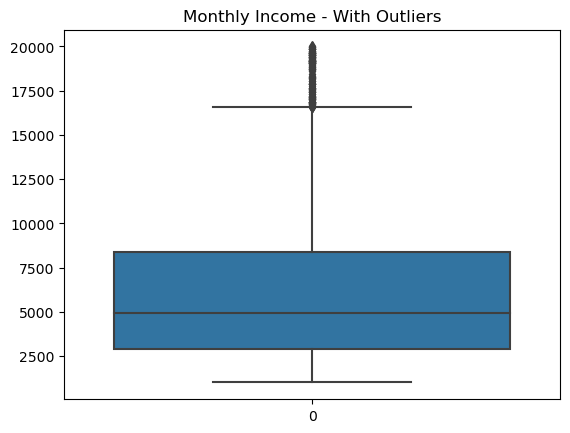

In [39]:
# Monthly Income
sns.boxplot(df['MonthlyIncome'])
plt.title('Monthly Income - With Outliers')

In [40]:
Q3 = df['MonthlyIncome'].quantile(.75)
Q1 = df['MonthlyIncome'].quantile(.25)
IQR = Q3 - Q1
UL = Q3 + 1.5*(IQR)
LL = Q1 - 1.5*(IQR)
print(UL)
print(LL)

16581.0
-5291.0


In [41]:
df['MonthlyIncome'] = np.where(df['MonthlyIncome'] > 16581, 16581, np.where(df['MonthlyIncome'] < -5291, -5291, df['MonthlyIncome']))

Text(0.5, 1.0, 'Monthly Income - Without Outliers')

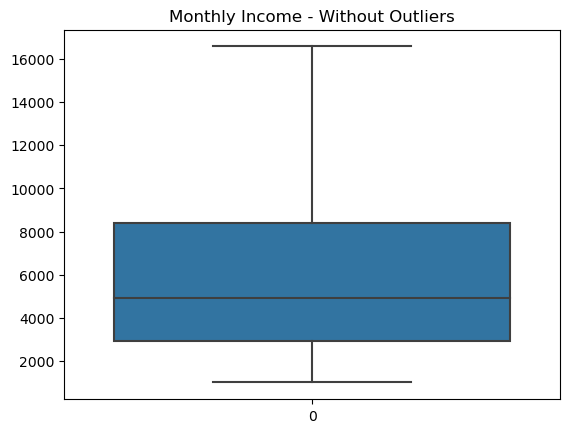

In [42]:
sns.boxplot(df['MonthlyIncome'])
plt.title('Monthly Income - Without Outliers')

Text(0.5, 1.0, 'Total Working Years - With Outliers')

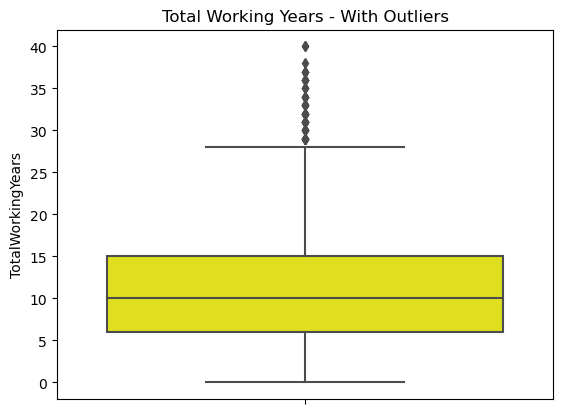

In [43]:
# TotalWorkingYears

sns.boxplot(data = df, y = 'TotalWorkingYears', color = 'yellow')
plt.title('Total Working Years - With Outliers')

In [44]:
Q3 = df['TotalWorkingYears'].quantile(.75)
Q1 = df['TotalWorkingYears'].quantile(.25)
IQR = Q3 - Q1
UL = Q3 + 1.5*(IQR)
LL = Q1 - 1.5*(IQR)
print(UL)
print(LL)

28.5
-7.5


In [45]:
df['TotalWorkingYears'] = np.where(df['TotalWorkingYears'] > 28.5, 28.5, np.where(df['TotalWorkingYears'] < -7.5, -7.5, df['TotalWorkingYears']))

Text(0.5, 1.0, 'Total Working Years - Without Outliers')

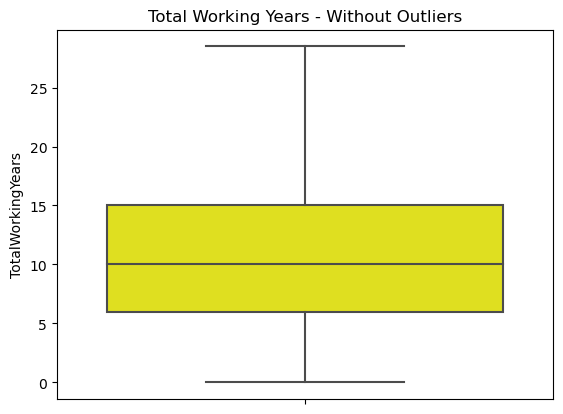

In [46]:
sns.boxplot(data = df, y = 'TotalWorkingYears', color = 'yellow')
plt.title('Total Working Years - Without Outliers')

Text(0.5, 1.0, 'Years At Company - With Outliers')

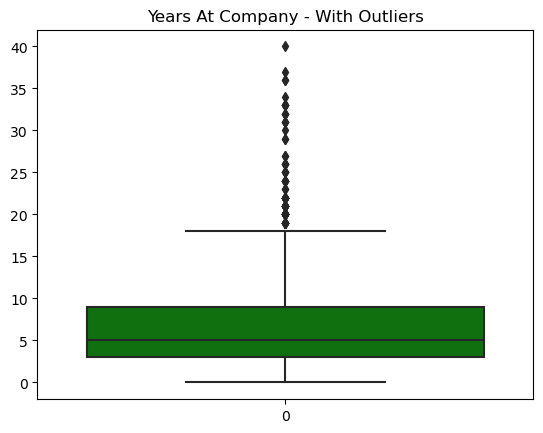

In [47]:
# YearsAtCompany

sns.boxplot(df['YearsAtCompany'], color = 'green')
plt.title('Years At Company - With Outliers')

In [48]:
Q3 = df['YearsAtCompany'].quantile(.75)
Q1 = df['YearsAtCompany'].quantile(.25)
IQR = Q3 - Q1
UL = Q3 + 1.5*(IQR)
LL = Q1 - 1.5*(IQR)
print(UL)
print(LL)

18.0
-6.0


In [49]:
df['YearsAtCompany'] = np.where(df['YearsAtCompany'] > 18, 18, np.where(df['YearsAtCompany'] < -6, -6, df['YearsAtCompany']))

Text(0.5, 1.0, 'Years At Company - Without Outliers')

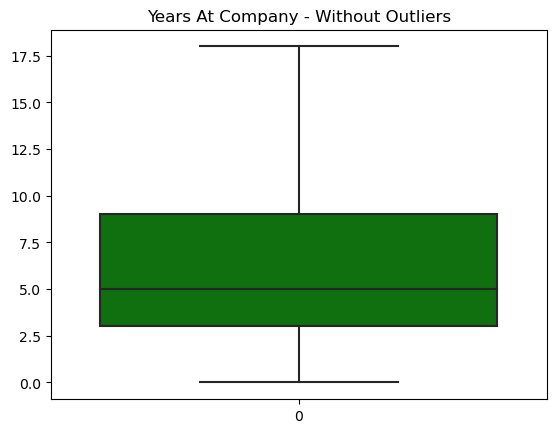

In [50]:
sns.boxplot(df['YearsAtCompany'], color = 'green')
plt.title('Years At Company - Without Outliers')

Text(0.5, 1.0, 'Years In Current Role - With Outliers')

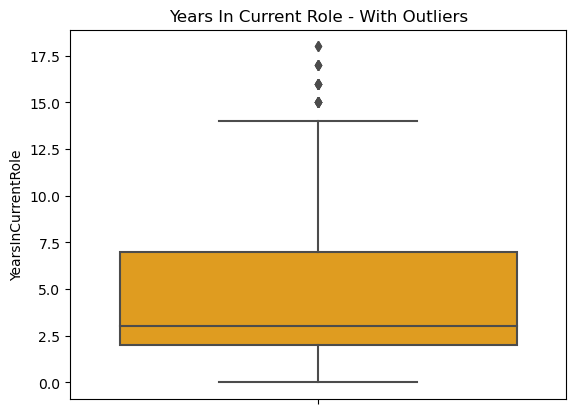

In [51]:
# YearsInCurrentRole

sns.boxplot(data = df, y = 'YearsInCurrentRole', color = 'orange')
plt.title('Years In Current Role - With Outliers')

In [52]:
Q3 = df['YearsInCurrentRole'].quantile(.75)
Q1 = df['YearsInCurrentRole'].quantile(.25)
IQR = Q3 - Q1
UL = Q3 + 1.5*(IQR)
LL = Q1 - 1.5*(IQR)
print(UL)
print(LL)

14.5
-5.5


In [53]:
df['YearsInCurrentRole'] = np.where(df['YearsInCurrentRole'] > 14.5, 14.5, np.where(df['YearsInCurrentRole'] < -5.5, -5.5, df['YearsInCurrentRole']))

Text(0.5, 1.0, 'Years In Current Role - Without Outliers')

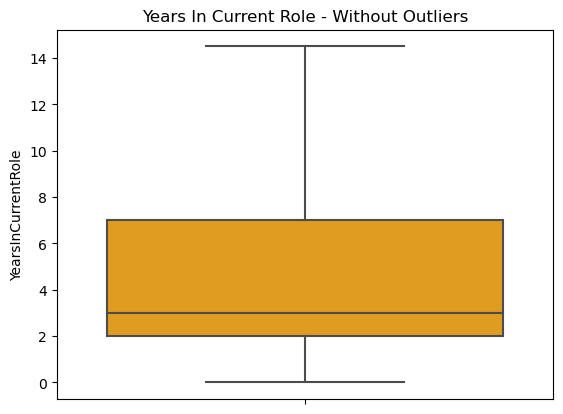

In [54]:
sns.boxplot(data = df, y = 'YearsInCurrentRole', color = 'orange')
plt.title('Years In Current Role - Without Outliers')

Text(0.5, 1.0, 'Years Since Last Promotion - With Outliers')

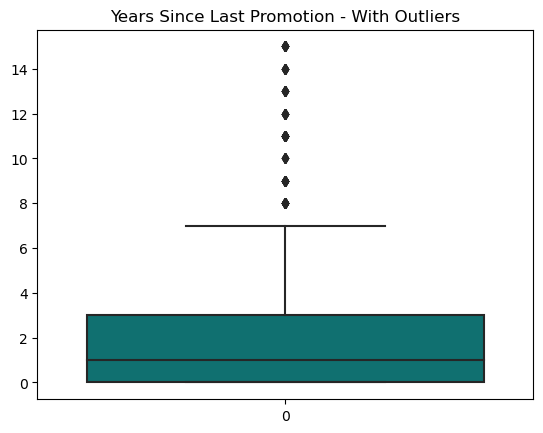

In [55]:
# YearsSinceLastPromotion

sns.boxplot(df['YearsSinceLastPromotion'], color = 'teal')
plt.title('Years Since Last Promotion - With Outliers')

In [56]:
Q3 = df['YearsSinceLastPromotion'].quantile(.75)
Q1 = df['YearsSinceLastPromotion'].quantile(.25)
IQR = Q3 - Q1
UL = Q3 + 1.5*(IQR)
LL = Q1 - 1.5*(IQR)
print(UL)
print(LL)

7.5
-4.5


In [57]:
df['YearsSinceLastPromotion'] = np.where(df['YearsSinceLastPromotion'] > 7.5, 7.5, np.where(df['YearsSinceLastPromotion'] < -4.5, -4.5, df['YearsSinceLastPromotion']))

Text(0.5, 1.0, 'Years Since Last Promotion - Without Outliers')

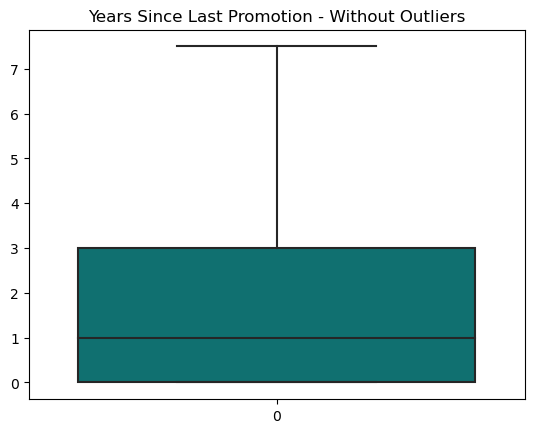

In [58]:
sns.boxplot(df['YearsSinceLastPromotion'], color = 'teal')
plt.title('Years Since Last Promotion - Without Outliers')

Text(0.5, 1.0, 'Years With Curr Manager - With Outliers')

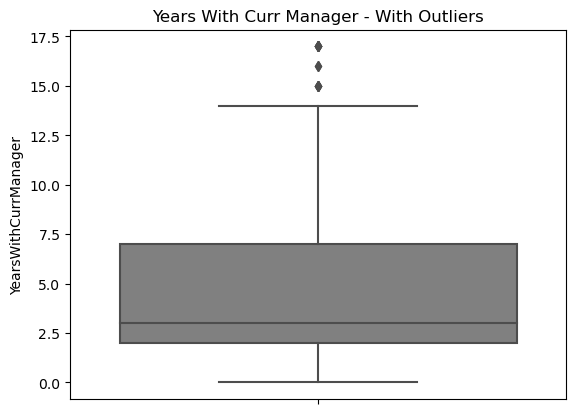

In [59]:
# YearsWithCurrManager

sns.boxplot(data = df, y = 'YearsWithCurrManager', color = 'grey')
plt.title('Years With Curr Manager - With Outliers')

In [60]:
Q3 = df['YearsWithCurrManager'].quantile(.75)
Q1 = df['YearsWithCurrManager'].quantile(.25)
IQR = Q3 - Q1
UL = Q3 + 1.5*(IQR)
LL = Q1 - 1.5*(IQR)
print(UL)
print(LL)

14.5
-5.5


In [61]:
df['YearsWithCurrManager'] = np.where(df['YearsWithCurrManager'] > 14.5, 14.5, np.where(df['YearsWithCurrManager'] < -5.5, -5.5, df['YearsWithCurrManager']))

Text(0.5, 1.0, 'Years With Curr Manager - Without Outliers')

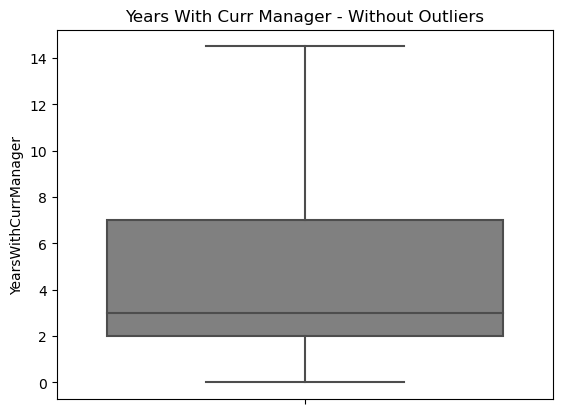

In [62]:
sns.boxplot(data = df, y = 'YearsWithCurrManager', color = 'grey')
plt.title('Years With Curr Manager - Without Outliers')

C:\Users\Pritam Laskar\AppData\Local\Temp\ipykernel_12340\4123552269.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['Age'], ax = axes[0, 0])
C:\Users\Pritam Laskar\AppData\Local\Temp\ipykernel_12340\4123552269.py:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['DailyRate'], ax = axe

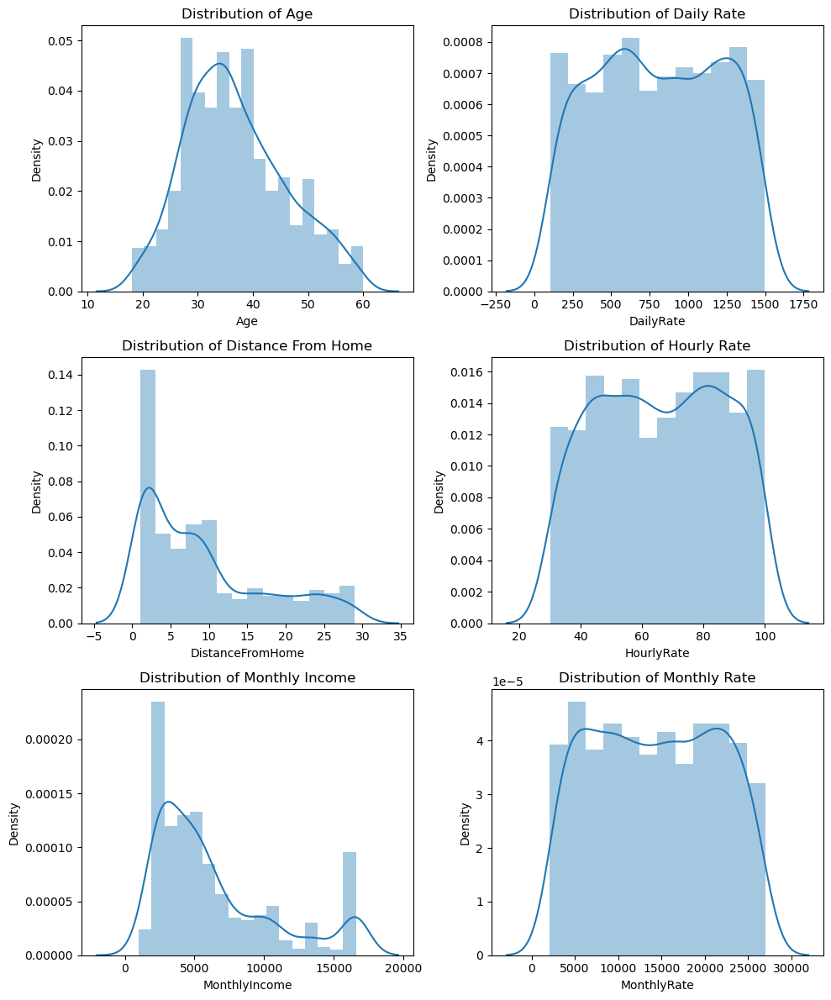

In [63]:
# Distribution

fig, axes = plt.subplots(nrows = 3, ncols = 2, figsize=(10, 12))

# Plot 1: Distribution of Age
sns.distplot(df['Age'], ax = axes[0, 0])
axes[0, 0].set_title('Distribution of Age')

# Plot 2: Distribution of Daily Rate
sns.distplot(df['DailyRate'], ax = axes[0, 1])
axes[0, 1].set_title('Distribution of Daily Rate')

# Plot 3: Distribution of Distance From Home
sns.distplot(df['DistanceFromHome'], ax = axes[1, 0])
axes[1, 0].set_title('Distribution of Distance From Home')

# Plot 4: Distribution of Hourly Rate
sns.distplot(df['HourlyRate'], ax = axes[1, 1])
axes[1, 1].set_title('Distribution of Hourly Rate')

# Plot 5: Distribution of Monthly Income
sns.distplot(df['MonthlyIncome'], ax = axes[2, 0])
axes[2, 0].set_title('Distribution of Monthly Income')

# Plot 6: Distribution of Monthly Rate
sns.distplot(df['MonthlyRate'], ax = axes[2, 1])
axes[2, 1].set_title('Distribution of Monthly Rate')

plt.tight_layout()
plt.show()


In [64]:
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1024.865306,2.721769,65.891156,2.729932,2.063946,2.728571,6361.891837,14313.103401,2.693197,15.209524,3.153741,2.712245,0.793878,11.103061,2.799320,2.761224,6.617687,4.207823,1.922789,4.107483
std,9.135373,403.509100,8.106864,1.024165,602.024335,1.093082,20.329428,0.711561,1.106940,1.102846,4353.345470,7117.786044,2.498009,3.659938,0.360824,1.081209,0.852077,7.303828,1.289271,0.706476,4.989788,3.555335,2.478222,3.517487
min,18.000000,102.000000,1.000000,1.000000,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,2094.000000,0.000000,11.000000,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,491.250000,2.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,8047.000000,1.000000,12.000000,3.000000,2.000000,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1020.500000,3.000000,66.000000,3.000000,2.000000,3.000000,4919.000000,14235.500000,2.000000,14.000000,3.000000,3.000000,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1555.750000,4.000000,83.750000,3.000000,3.000000,4.000000,8379.000000,20461.500000,4.000000,18.000000,3.000000,4.000000,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,2068.000000,4.000000,100.000000,4.000000,5.000000,4.000000,16581.000000,26999.000000,9.000000,25.000000,4.000000,4.000000,3.000000,28.500000,6.000000,4.000000,18.000000,14.500000,7.500000,14.500000


In [65]:
df['TotalWorkingYears'] = df['TotalWorkingYears'].astype(int)
df['YearsWithCurrManager'] = df['YearsWithCurrManager'].astype(int)
df['YearsSinceLastPromotion'] = df['YearsSinceLastPromotion'].astype(int)
df['YearsInCurrentRole'] = df['YearsInCurrentRole'].astype(int)

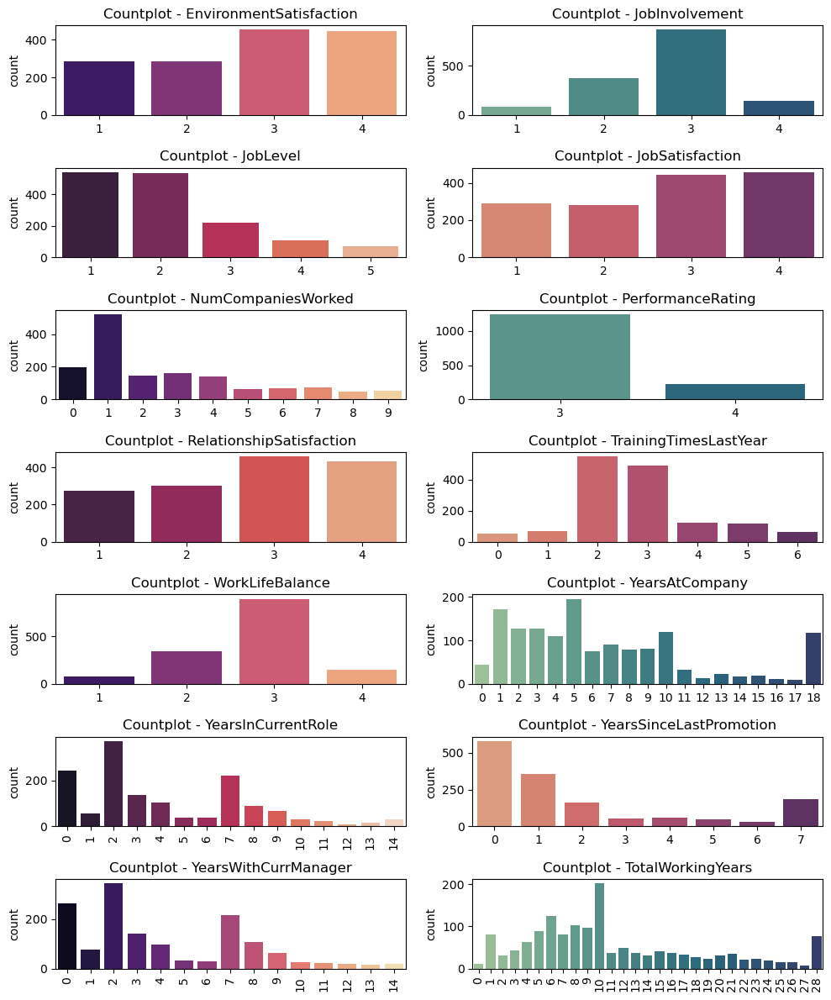

In [66]:
# Countplots

fig, axes = plt.subplots(nrows = 7, ncols = 2, figsize = (10, 12))

# Subplot 1: EnvironmentSatisfaction
sns.countplot(data = df, x = 'EnvironmentSatisfaction', palette = 'magma', ax = axes[0,0])
axes[0,0].set_title('Countplot - EnvironmentSatisfaction')
axes[0,0].set_xlabel('');

# Subplot 2: JobInvolvement
sns.countplot(data = df, x = 'JobInvolvement', palette = 'crest', ax = axes[0,1])
axes[0,1].set_title('Countplot - JobInvolvement')
axes[0,1].set_xlabel('');

# Subplot 3: JobLevel
sns.countplot(data = df, x = 'JobLevel', palette = 'rocket', ax = axes[1,0])
axes[1,0].set_title('Countplot - JobLevel')
axes[1,0].set_xlabel('');

# Subplot 4: JobSatisfaction
sns.countplot(data = df, x = 'JobSatisfaction', palette = 'flare', ax = axes[1,1])
axes[1,1].set_title('Countplot - JobSatisfaction')
axes[1,1].set_xlabel('');

# Subplot 5: NumCompaniesWorked
sns.countplot(data = df, x = 'NumCompaniesWorked', palette = 'magma', ax = axes[2,0])
axes[2,0].set_title('Countplot - NumCompaniesWorked')
axes[2,0].set_xlabel('');

# Subplot 6: PerformanceRating
sns.countplot(data = df, x = 'PerformanceRating', palette = 'crest', ax = axes[2,1])
axes[2,1].set_title('Countplot - PerformanceRating')
axes[2,1].set_xlabel('');

# Subplot 7: RelationshipSatisfaction
sns.countplot(data = df, x = 'RelationshipSatisfaction', palette = 'rocket', ax = axes[3,0])
axes[3,0].set_title('Countplot - RelationshipSatisfaction')
axes[3,0].set_xlabel('');

# Subplot 8: TrainingTimesLastYear
sns.countplot(data = df, x = 'TrainingTimesLastYear', palette = 'flare', ax = axes[3,1])
axes[3,1].set_title('Countplot - TrainingTimesLastYear')
axes[3,1].set_xlabel('');

# Subplot 9: WorkLifeBalance
sns.countplot(data = df, x = 'WorkLifeBalance', palette = 'magma', ax = axes[4,0])
axes[4,0].set_title('Countplot - WorkLifeBalance')
axes[4,0].set_xlabel('');

# Subplot 10: YearsAtCompany
sns.countplot(data = df, x = 'YearsAtCompany', palette = 'crest', ax = axes[4,1])
axes[4,1].set_title('Countplot - YearsAtCompany')
axes[4,1].set_xlabel('');

# Subplot 11: YearsInCurrentRole
sns.countplot(data = df, x = 'YearsInCurrentRole', palette = 'rocket', ax = axes[5,0])
axes[5,0].set_title('Countplot - YearsInCurrentRole')
axes[5,0].set_xticklabels(axes[5,0].get_xticklabels(), rotation = 90)
axes[5,0].set_xlabel('');

# Subplot 12: YearsSinceLastPromotion
sns.countplot(data = df, x = 'YearsSinceLastPromotion', palette = 'flare', ax = axes[5,1])
axes[5,1].set_title('Countplot - YearsSinceLastPromotion')
axes[5,1].set_xlabel('');

# Subplot 13: YearsWithCurrManager
sns.countplot(data = df, x = 'YearsWithCurrManager', palette = 'magma', ax = axes[6,0])
axes[6,0].set_title('Countplot - YearsWithCurrManager')
axes[6,0].set_xticklabels(axes[6,0].get_xticklabels(), rotation = 90)
axes[6,0].set_xlabel('');

# Suplot 14: TotalWorkingYears
sns.countplot(data = df, x = 'TotalWorkingYears', palette = 'crest', ax = axes[6,1])
axes[6,1].set_title('Countplot - TotalWorkingYears')
axes[6,1].set_xticklabels(axes[6,1].get_xticklabels(), rotation = 90)
axes[6,1].set_xlabel('');

plt.tight_layout()
plt.show()

In [67]:
df.select_dtypes(include = 'object')

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,OverTime
0,Yes,Travel_Rarely,Sales,Life Sciences,Female,Sales Executive,Single,Yes
1,No,Travel_Frequently,Research & Development,Life Sciences,Male,Research Scientist,Married,No
2,Yes,Travel_Rarely,Research & Development,Other,Male,Laboratory Technician,Single,Yes
3,No,Travel_Frequently,Research & Development,Life Sciences,Female,Research Scientist,Married,Yes
4,No,Travel_Rarely,Research & Development,Medical,Male,Laboratory Technician,Married,No
...,...,...,...,...,...,...,...,...
1465,No,Travel_Frequently,Research & Development,Medical,Male,Laboratory Technician,Married,No
1466,No,Travel_Rarely,Research & Development,Medical,Male,Healthcare Representative,Married,No
1467,No,Travel_Rarely,Research & Development,Life Sciences,Male,Manufacturing Director,Married,Yes
1468,No,Travel_Frequently,Sales,Medical,Male,Sales Executive,Married,No


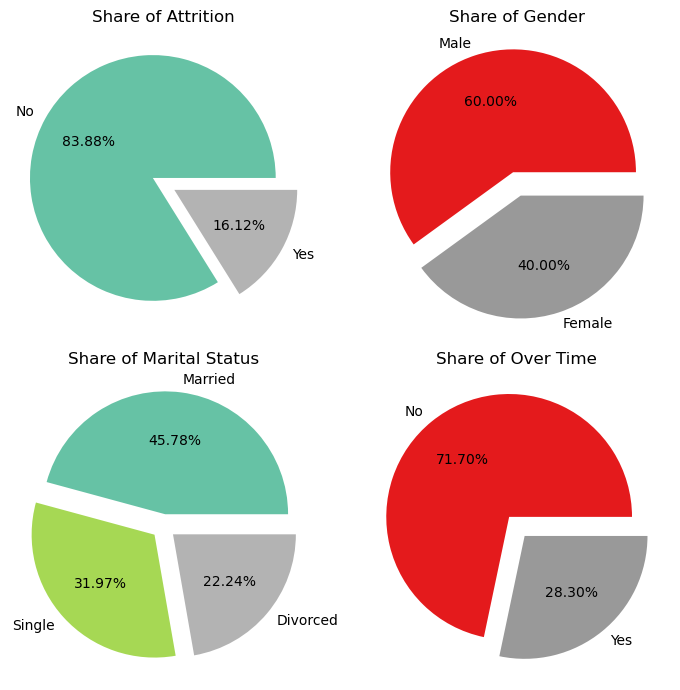

In [68]:
# Attrition, Gender, Marital Status, and Over Time

fig, axes = plt.subplots(nrows = 2, ncols = 2, figsize = (7,7))

# Subplot 1: Share of Attrition
df['Attrition'].value_counts().plot(kind = 'pie', autopct = '%.2f%%', explode = [0.1, 0.1], cmap = 'Set2', ax = axes[0,0]);
axes[0,0].set_title('Share of Attrition');
axes[0,0].set_ylabel('');

# Subplot 2: Share of Gender
df['Gender'].value_counts().plot(kind = 'pie', autopct = '%.2f%%', explode = [0.1, 0.1], cmap = 'Set1', ax = axes[0,1]);
axes[0,1].set_title('Share of Gender');
axes[0,1].set_ylabel('');

# Subplot 2: Marital Status
df['MaritalStatus'].value_counts().plot(kind = 'pie', autopct = '%.2f%%', explode = [0.1, 0.1, 0.1], cmap = 'Set2', ax = axes[1,0]);
axes[1,0].set_title('Share of Marital Status');
axes[1,0].set_ylabel('');

# Subplot 4: OverTime
df['OverTime'].value_counts().plot(kind = 'pie', autopct = '%.2f%%', explode = [0.1, 0.1], cmap = 'Set1', ax = axes[1,1]);
axes[1,1].set_title('Share of Over Time');
axes[1,1].set_ylabel('');

plt.tight_layout()
plt.show()

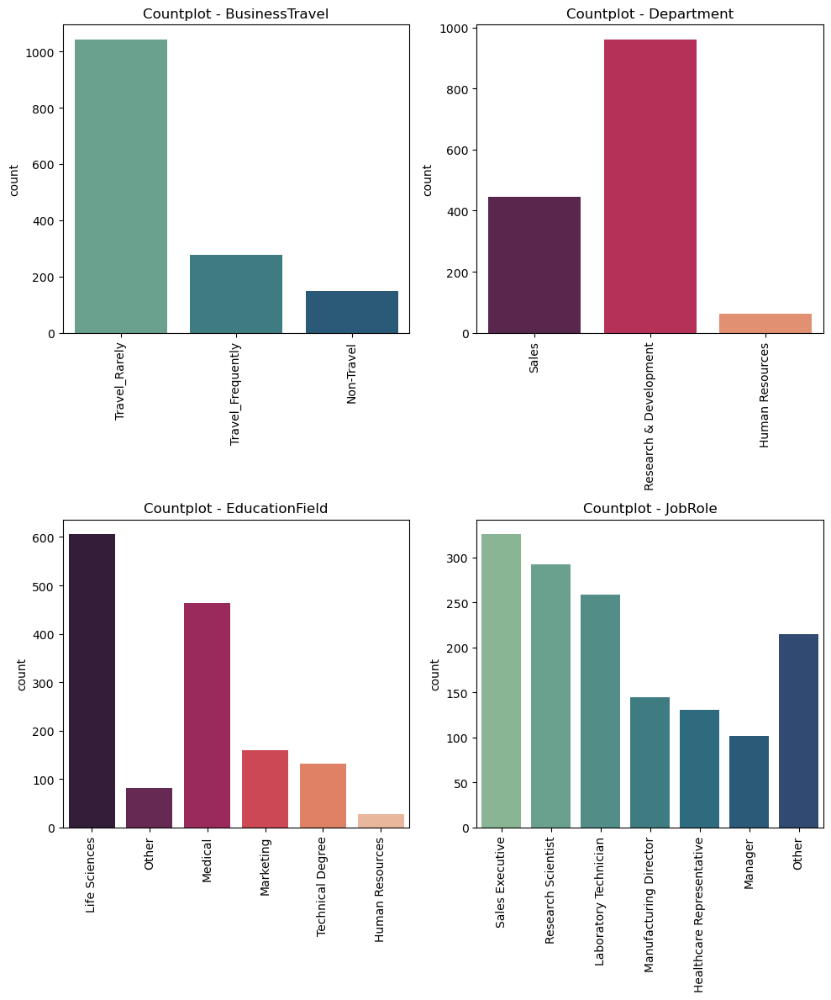

In [69]:
# Business Travel, Department, Education Field, Job Role

fig, axes = plt.subplots(nrows = 2, ncols = 2, figsize = (10,12))

# Subplot 1: Business Travel
sns.countplot(data = df, x = 'BusinessTravel', palette = 'crest', ax = axes[0,0])
axes[0,0].set_title('Countplot - BusinessTravel');
axes[0,0].set_xticklabels(axes[0,0].get_xticklabels(), rotation = 90);
axes[0,0].set_xlabel('');

# Subplot 2: Department
sns.countplot(data = df, x = 'Department', palette = 'rocket', ax = axes[0,1])
axes[0,1].set_title('Countplot - Department');
axes[0,1].set_xticklabels(axes[0,1].get_xticklabels(), rotation = 90);
axes[0,1].set_xlabel('');

# Subplot 3: EducationField
sns.countplot(data = df, x = 'EducationField', palette = 'rocket', ax = axes[1,0])
axes[1,0].set_title('Countplot - EducationField');
axes[1,0].set_xticklabels(axes[1,0].get_xticklabels(), rotation = 90);
axes[1,0].set_xlabel('');

# Subplot 4: JobRole
sns.countplot(data = df, x = 'JobRole', palette = 'crest', ax = axes[1,1])
axes[1,1].set_title('Countplot - JobRole');
axes[1,1].set_xticklabels(axes[1,1].get_xticklabels(), rotation = 90);
axes[1,1].set_xlabel('');

# Adjust the layout and spacing
plt.tight_layout()

# Show the plot
plt.show()

# Bivariate Analysis and Multivariate Analysis

In [70]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 32 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeNumber            1470 non-null   int64 
 9   EnvironmentSatisfaction   1470 non-null   int64 
 10  Gender                    1470 non-null   object
 11  HourlyRate                1470 non-null   int64 
 12  JobInvolvement            1470 non-null   int64 
 13  JobLevel                  1470 non-null   int64 
 14  JobRole                 

In [71]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Yes,11,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,No,23,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Yes,15,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Yes,11,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,No,12,3,4,1,6,3,3,2,2,2,2


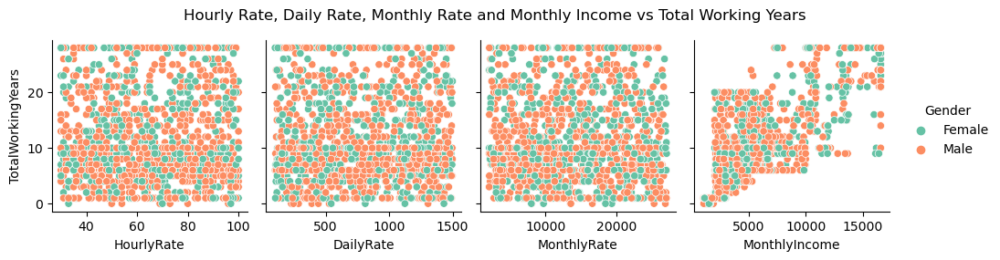

In [72]:
# Pairplot

pairplot = sns.pairplot(data = df, x_vars = ['HourlyRate' , 'DailyRate', 'MonthlyRate', 'MonthlyIncome'], y_vars = 'TotalWorkingYears', hue = 'Gender', palette = 'Set2');
pairplot.fig.suptitle('Hourly Rate, Daily Rate, Monthly Rate and Monthly Income vs Total Working Years', y = 1.10);

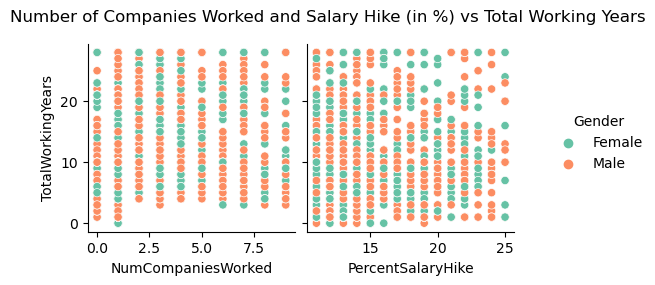

In [73]:
# Pairplot

pairplot = sns.pairplot(data = df, x_vars = ['NumCompaniesWorked', 'PercentSalaryHike'], y_vars = 'TotalWorkingYears', hue = 'Gender', palette = 'Set2');
pairplot.fig.suptitle('Number of Companies Worked and Salary Hike (in %) vs Total Working Years', y = 1.10);


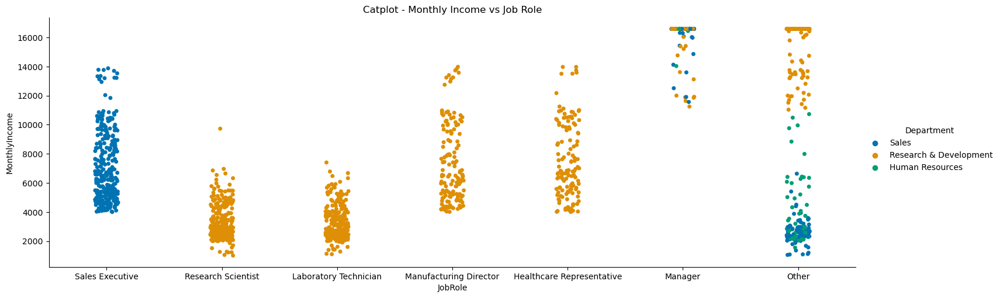

In [74]:
# Catplot

sns.catplot(data = df, x = 'JobRole', y = 'MonthlyIncome', hue = 'Department', palette = 'colorblind', height = 5, aspect = 3);
plt.title('Catplot - Monthly Income vs Job Role');

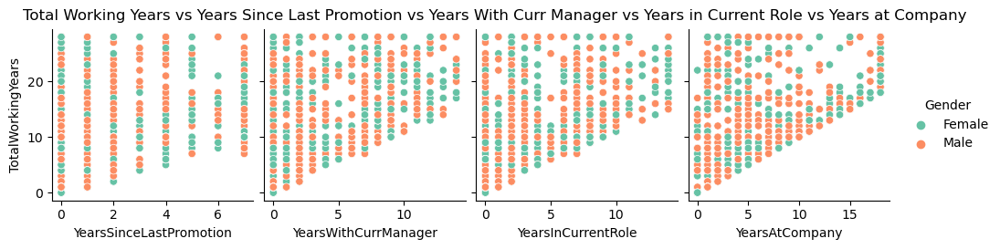

In [75]:
# Pairplot 

pairplot = sns.pairplot(data = df, x_vars = ['YearsSinceLastPromotion', 'YearsWithCurrManager', 'YearsInCurrentRole', 'YearsAtCompany'], y_vars = 'TotalWorkingYears', hue = 'Gender', palette = 'Set2');
pairplot.fig.suptitle('Total Working Years vs Years Since Last Promotion vs Years With Curr Manager vs Years in Current Role vs Years at Company', y = 1.05);

Text(0.5, 1.0, 'Business Travel by Total Working Years')

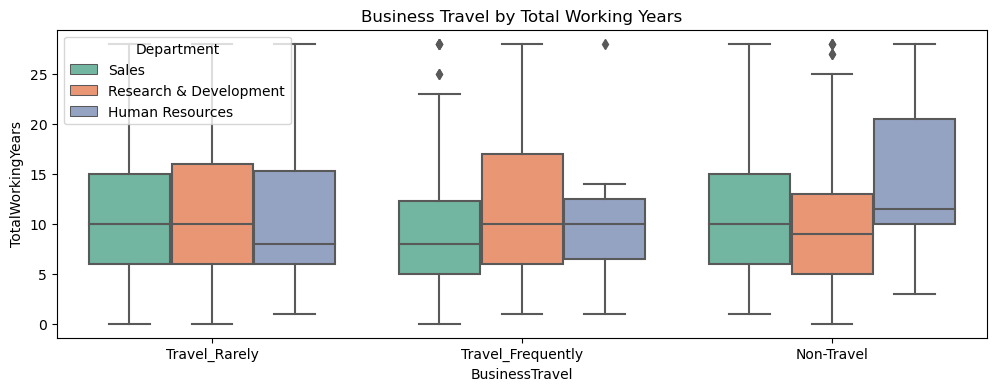

In [76]:
# Boxplot - Business Travel and Total Working Years

plt.figure(figsize = (12,4))
sns.boxplot(data = df, y = 'TotalWorkingYears', x = 'BusinessTravel', palette = 'Set2', hue = 'Department');
plt.title('Business Travel by Total Working Years')

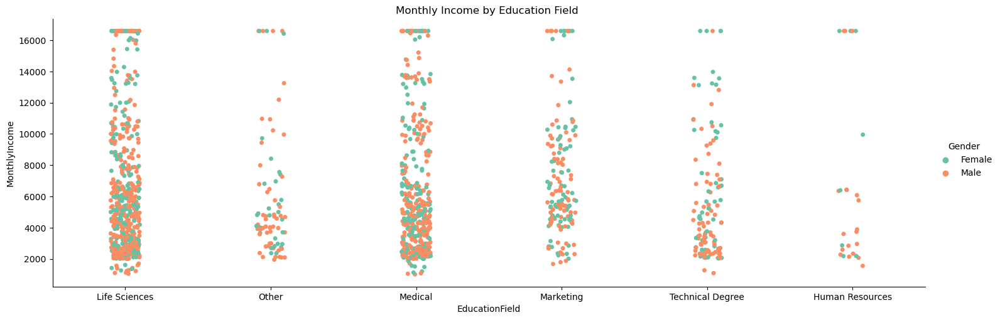

In [77]:
# Catplot

sns.catplot(data = df, x = 'EducationField', y = 'MonthlyIncome', hue = 'Gender', palette = 'Set2', height = 5, aspect = 3);
plt.title('Monthly Income by Education Field ');

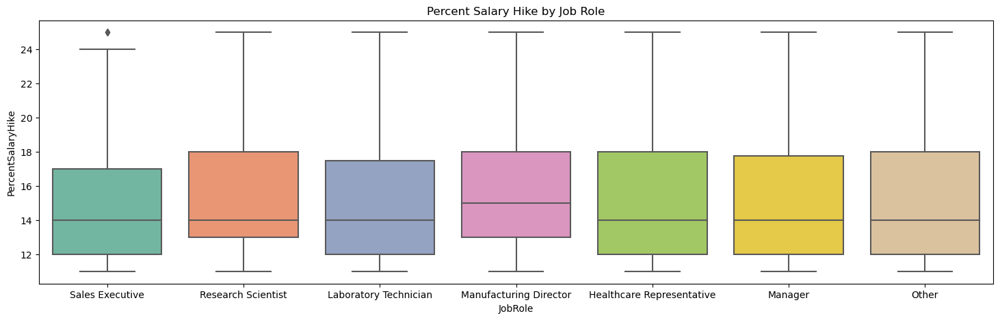

In [78]:
# Boxplot - Percent Salary Hike by Job Role

plt.figure(figsize = (18,5))
sns.boxplot(data = df, x = 'JobRole', y = 'PercentSalaryHike', palette = 'Set2');
plt.title('Percent Salary Hike by Job Role');

# Dummy Values and Multicollinearity

In [79]:
df_num = df.select_dtypes(np.number)
df_cat = df.select_dtypes(include = 'object')
df_dummy = pd.get_dummies(df_cat, drop_first = True)
df_dummy

,Attrition_Yes,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Research & Development,Department_Sales,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Male,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Other,JobRole_Research Scientist,JobRole_Sales Executive,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes
0,1,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,1,1
1,0,1,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0
2,1,0,1,1,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,1
3,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,1
4,0,0,1,1,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,0,1,0,1,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0
1466,0,0,1,1,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0
1467,0,0,1,1,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,1
1468,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,1,0,0


In [80]:
data = pd.concat([df_dummy, df_num], axis = 1)
data

,Attrition_Yes,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Research & Development,Department_Sales,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Male,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Other,JobRole_Research Scientist,JobRole_Sales Executive,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes,Age,DailyRate,DistanceFromHome,Education,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,1,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,1,1,41,1102,1,2,1,2,94,3,2,4,5993,19479,8,11,3,1,0,8,0,1,6,4,0,5
1,0,1,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,49,279,8,1,2,3,61,2,2,2,5130,24907,1,23,4,4,1,10,3,3,10,7,1,7
2,1,0,1,1,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,1,37,1373,2,2,4,4,92,2,1,3,2090,2396,6,15,3,2,0,7,3,3,0,0,0,0
3,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,1,33,1392,3,4,5,4,56,3,1,3,2909,23159,1,11,3,3,0,8,3,3,8,7,3,0
4,0,0,1,1,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,27,591,2,1,7,1,40,3,1,2,3468,16632,9,12,3,4,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,0,1,0,1,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,36,884,23,2,2061,3,41,4,2,4,2571,12290,4,17,3,3,1,17,3,3,5,2,0,3
1466,0,0,1,1,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,39,613,6,1,2062,4,42,2,3,1,9991,21457,4,15,3,1,1,9,5,3,7,7,1,7
1467,0,0,1,1,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,1,27,155,4,3,2064,2,87,4,2,2,6142,5174,1,20,4,2,1,6,0,3,6,2,0,3
1468,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,1,0,0,49,1023,2,3,2065,4,63,2,2,2,5390,13243,2,14,3,4,0,17,3,2,9,6,0,8


In [81]:
data.shape

(1470, 44)

<Axes: >

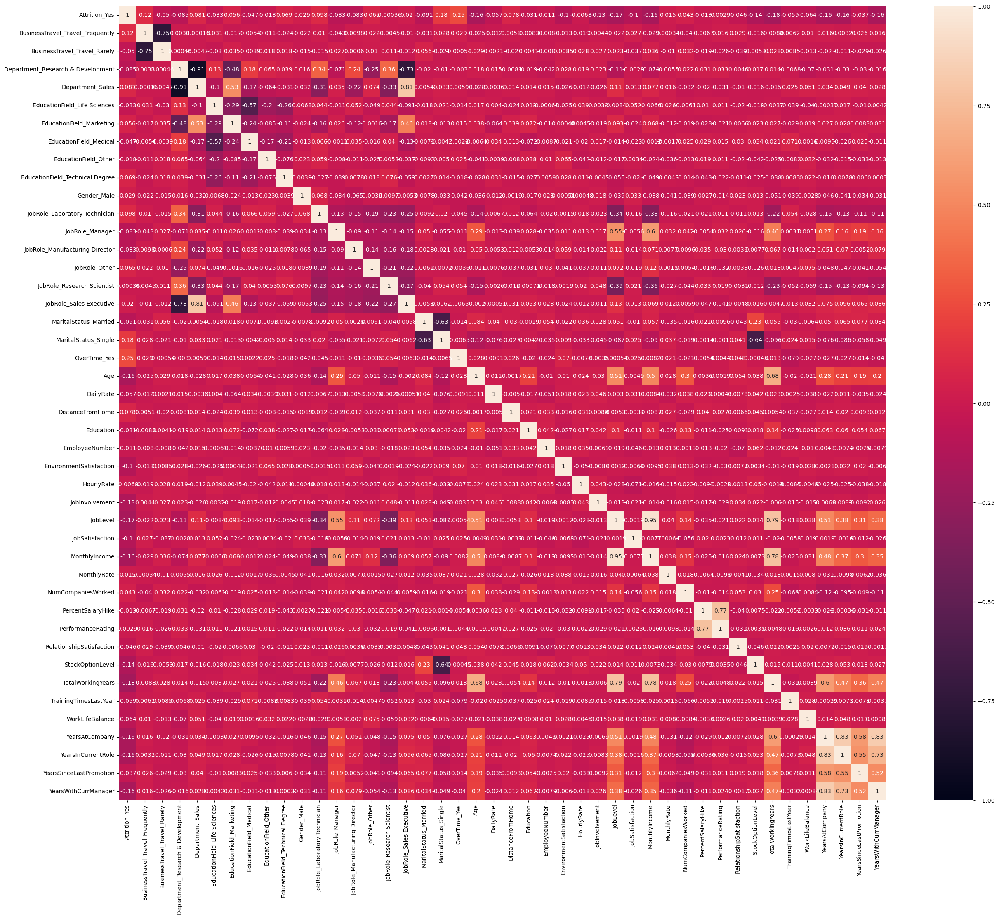

In [82]:
plt.figure(figsize = (30,25))
sns.heatmap(data.corr(), vmin = -1, vmax = 1, annot = True)

In [83]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif_data = pd.DataFrame()
vif_data

""


In [84]:
vif_data['features'] = data.columns
vif_data['VIF'] = [variance_inflation_factor(data.values, i) for i in range(len(data.columns))]
vif_data

,features,VIF
0,Attrition_Yes,1.572709
1,BusinessTravel_Travel_Frequently,2.918342
2,BusinessTravel_Travel_Rarely,8.016608
3,Department_Research & Development,42.832139
4,Department_Sales,17.178303
5,EducationField_Life Sciences,37.472511
6,EducationField_Marketing,11.266483
7,EducationField_Medical,28.939008
8,EducationField_Other,5.903951
9,EducationField_Technical Degree,8.971119


In [85]:
# The correlation between Business_Travel_Rarely and Business_Travel_Frequently is -0.75
# As among these two columns, VIF is higher for Business_Travel_Rarely, we will drop this column

data.drop(['BusinessTravel_Travel_Rarely'], axis = 1, inplace = True)

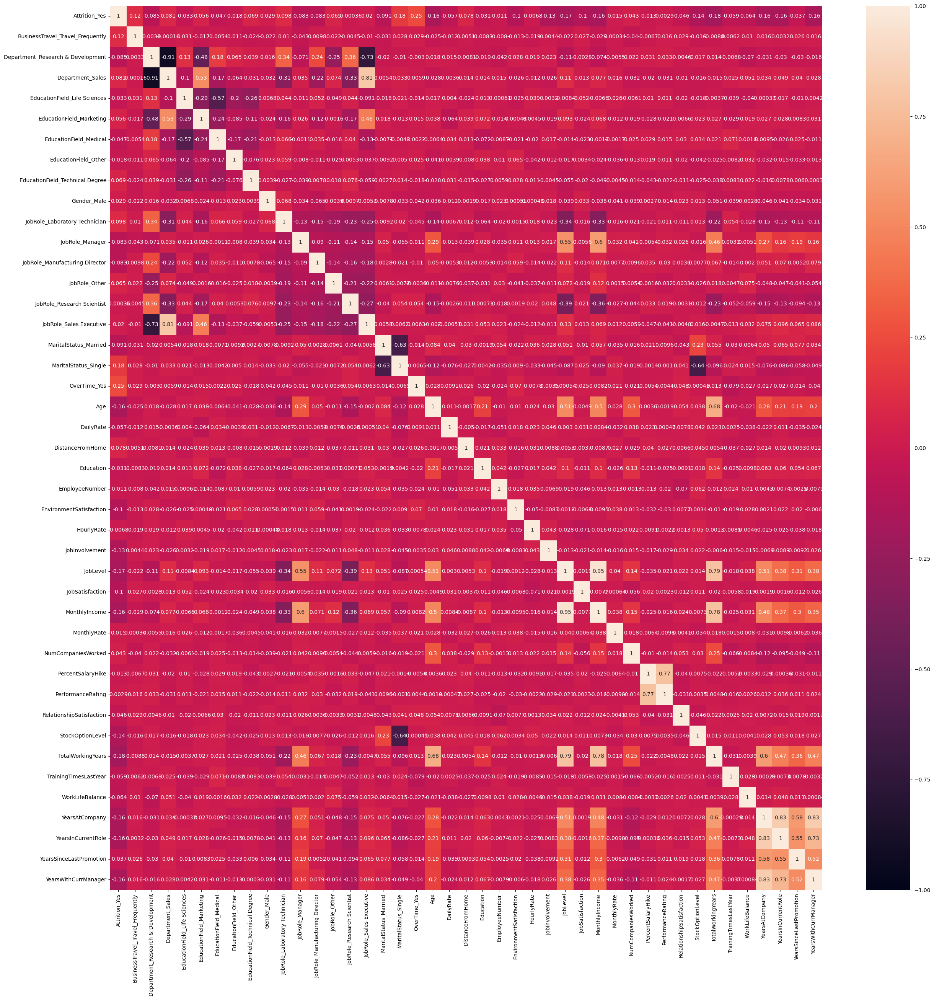

In [86]:
# Now we will check heatmap of data again:

plt.figure(figsize = (30,30))
sns.heatmap(data.corr(), vmin = -1, vmax = 1, annot = True);

In [87]:
# As multicollinearly still exists, we will continue with VIF again

vif_data = pd.DataFrame()
vif_data['features'] = data.columns
vif_data['VIF'] = [variance_inflation_factor(data.values, i) for i in range(len(data.columns))]
vif_data

,features,VIF
0,Attrition_Yes,1.562052
1,BusinessTravel_Travel_Frequently,1.269585
2,Department_Research & Development,42.819311
3,Department_Sales,17.176393
4,EducationField_Life Sciences,37.210424
5,EducationField_Marketing,11.167529
6,EducationField_Medical,28.743442
7,EducationField_Other,5.858968
8,EducationField_Technical Degree,8.918310
9,Gender_Male,2.557152


In [88]:
# High correlation of 0.91 exists between 'Department_Research & Development' and 'Department_Sales'
# As VIF between these two columns is higher for 'Department_Research & Development', we will drop this column

data.drop(['Department_Research & Development'], axis = 1, inplace = True)

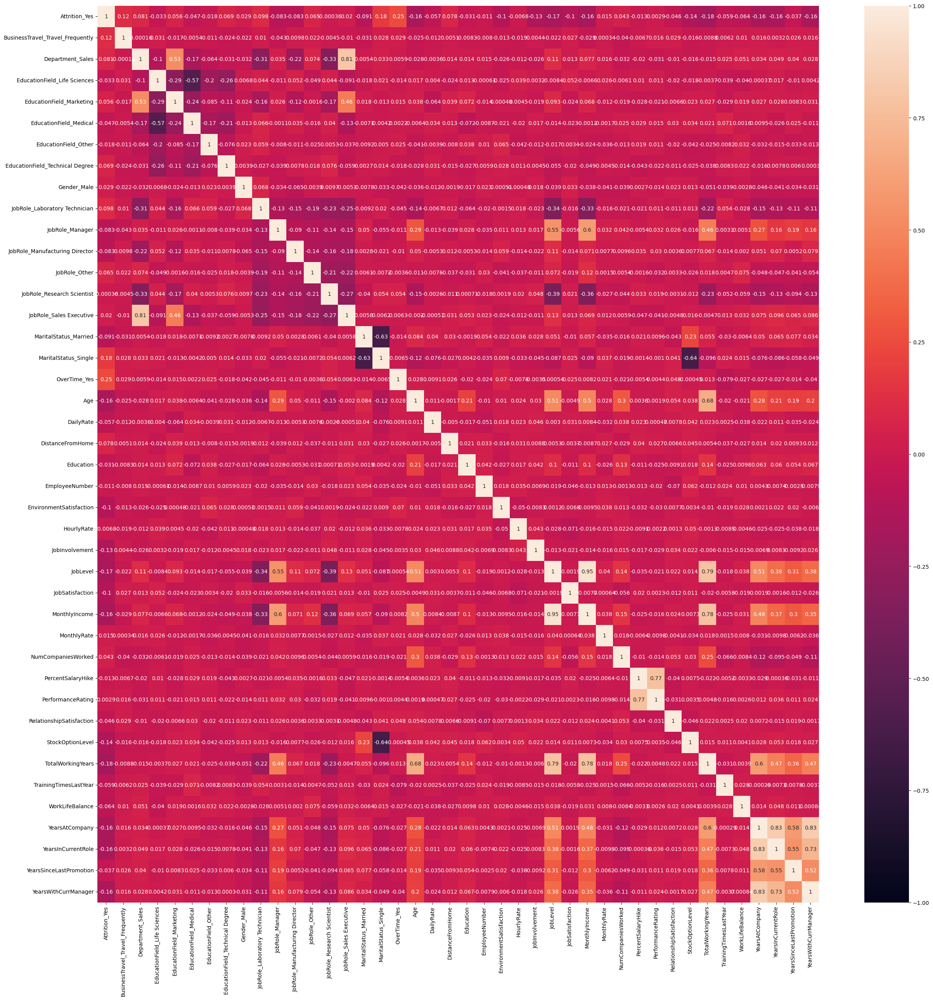

In [89]:
# We check heatmap again

plt.figure(figsize = (30,30))
sns.heatmap(data.corr(), vmin = -1, vmax = 1, annot = True);

In [90]:
# High correlation of 0.81 exists between 'Department_Sales' and 'JobRole_SalesExecutive'
# We will now call VIF to decide which among these columns shall be dropped

vif_data = pd.DataFrame()
vif_data['features'] = data.columns
vif_data['VIF'] = [variance_inflation_factor(data.values, i) for i in range(len(data.columns))]
vif_data

,features,VIF
0,Attrition_Yes,1.561028
1,BusinessTravel_Travel_Frequently,1.269127
2,Department_Sales,9.073059
3,EducationField_Life Sciences,24.457618
4,EducationField_Marketing,7.871797
5,EducationField_Medical,18.670732
6,EducationField_Other,4.115481
7,EducationField_Technical Degree,6.175151
8,Gender_Male,2.556488
9,JobRole_Laboratory Technician,3.552330


In [91]:
# As VIF of 'JobRole_Sales Executive' (9.49) > VIF of Department_Sales (9.07), we will drop 'JobRole_SalesExecutive'

data.drop(['JobRole_Sales Executive'], axis = 1, inplace = True)

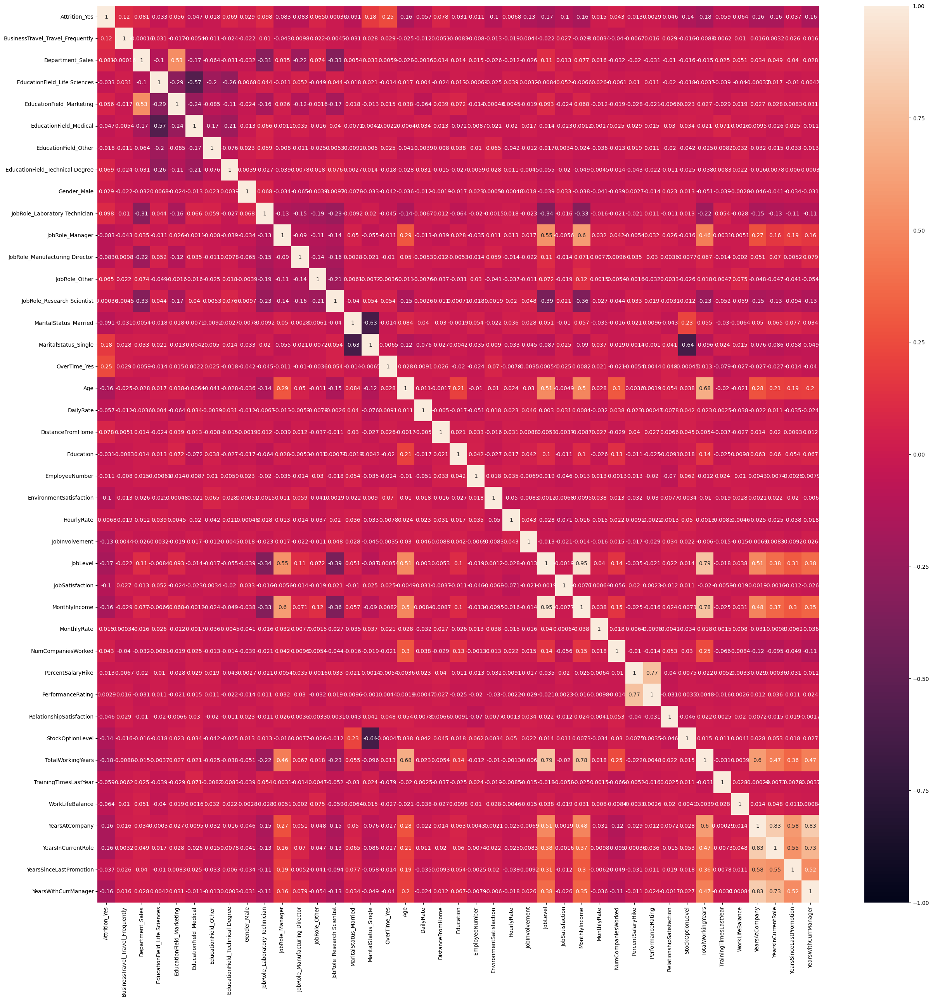

In [92]:
# Now check heatmap of data again:

plt.figure(figsize = (30,30))
sns.heatmap(data.corr(), vmin = -1, vmax = 1, annot = True);

In [93]:
# High correlation of 'Job Level' and 'Total Working Years' (0.79) exists and we will call VIF to decide which one to drop:

vif_data = pd.DataFrame()
vif_data['features'] = data.columns
vif_data['VIF'] = [variance_inflation_factor(data.values, i) for i in range(len(data.columns))]
vif_data

,features,VIF
0,Attrition_Yes,1.561007
1,BusinessTravel_Travel_Frequently,1.268422
2,Department_Sales,3.759141
3,EducationField_Life Sciences,23.212403
4,EducationField_Marketing,7.585696
5,EducationField_Medical,17.812460
6,EducationField_Other,3.972136
7,EducationField_Technical Degree,5.852752
8,Gender_Male,2.554450
9,JobRole_Laboratory Technician,3.383820


In [94]:
# As VIF of JobLevel (51) > VIF of Total Working Yeas (16), we will drop JobLevel

data.drop(['JobLevel'], axis = 1, inplace = True)

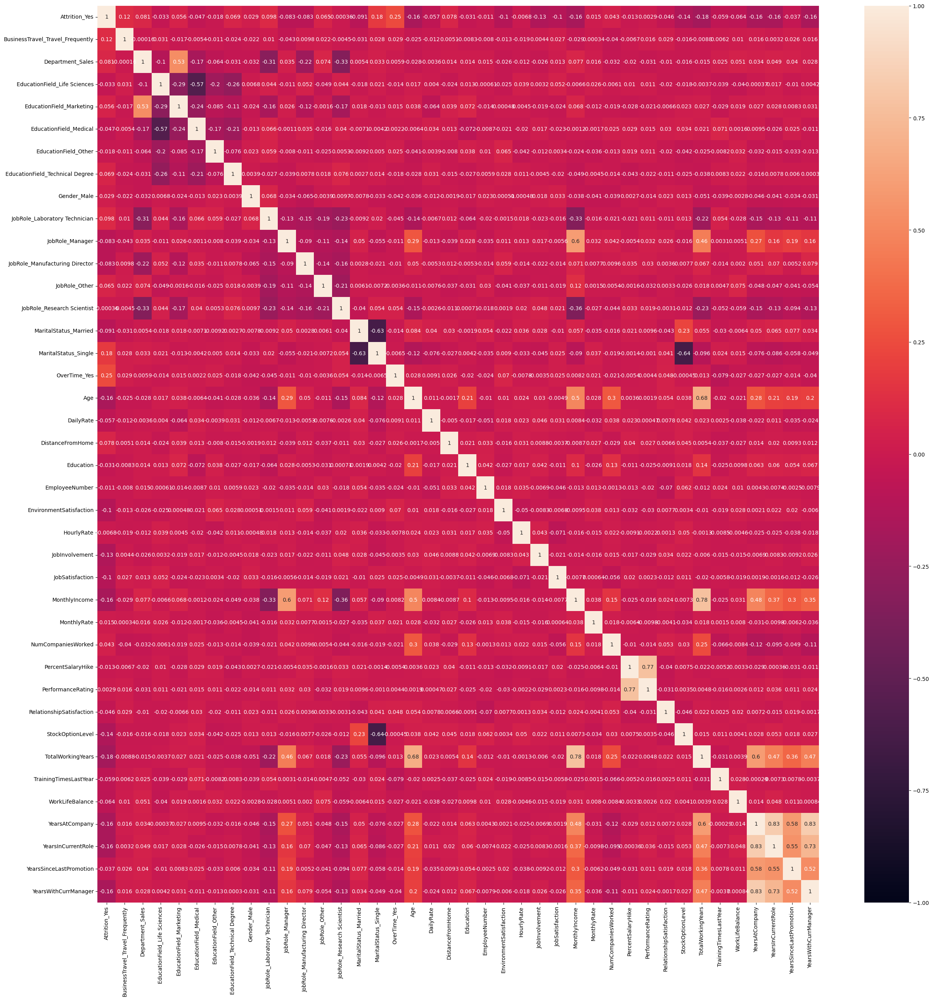

In [95]:
# Now check heatmap of data again:

plt.figure(figsize = (30,30))
sns.heatmap(data.corr(), vmin = -1, vmax = 1, annot = True);

In [96]:
# As high correlation of 0.78 MonthlyIncome and Total Working Years exist, we will call VIF to decide which one to drop:

vif_data = pd.DataFrame()
vif_data['features'] = data.columns
vif_data['VIF'] = [variance_inflation_factor(data.values, i) for i in range(len(data.columns))]
vif_data

,features,VIF
0,Attrition_Yes,1.559551
1,BusinessTravel_Travel_Frequently,1.268384
2,Department_Sales,3.759040
3,EducationField_Life Sciences,23.152652
4,EducationField_Marketing,7.568388
5,EducationField_Medical,17.778425
6,EducationField_Other,3.957141
7,EducationField_Technical Degree,5.844439
8,Gender_Male,2.552367
9,JobRole_Laboratory Technician,3.267688


In [97]:
# As VIF of Total Working Years (15) > VIF of Monthly Income (5), we will drop Total Working Years:

data.drop(['TotalWorkingYears'], axis = 1, inplace = True)

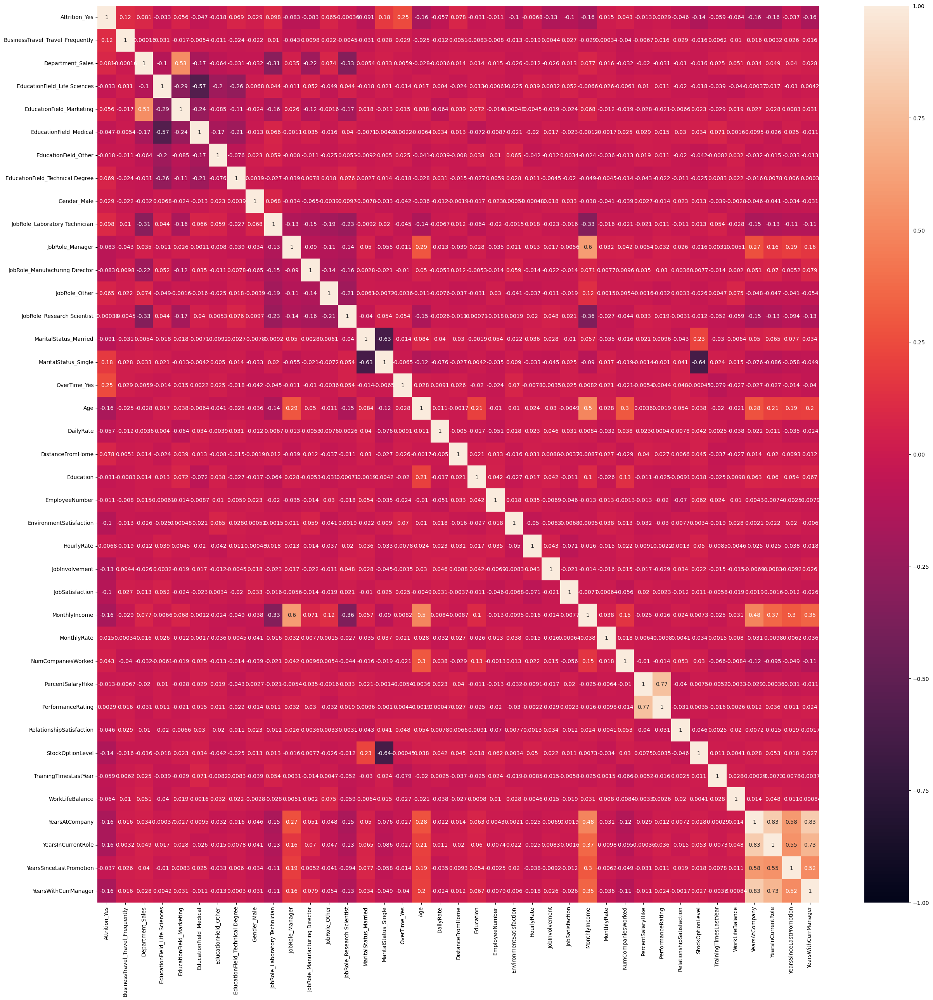

In [98]:
# Now check heatmap of data again:

plt.figure(figsize = (30,30))
sns.heatmap(data.corr(), vmin = -1, vmax = 1, annot = True);

In [99]:
# As high correlation of 0.83 exists between 'YearsinCurrentRole' and 'YearsatCompany', we will call VIF to decide which one to drop:

vif_data = pd.DataFrame()
vif_data['features'] = data.columns
vif_data['VIF'] = [variance_inflation_factor(data.values, i) for i in range(len(data.columns))]
vif_data

,features,VIF
0,Attrition_Yes,1.554011
1,BusinessTravel_Travel_Frequently,1.267039
2,Department_Sales,3.753061
3,EducationField_Life Sciences,23.066736
4,EducationField_Marketing,7.550715
5,EducationField_Medical,17.728865
6,EducationField_Other,3.949580
7,EducationField_Technical Degree,5.828253
8,Gender_Male,2.551303
9,JobRole_Laboratory Technician,3.263833


In [100]:
# As correlation of YearsAtCompany (17) > YearsInCurrentRole (8), we will drop YearsAtCompany:

data.drop(['YearsAtCompany'], axis = 1, inplace = True)

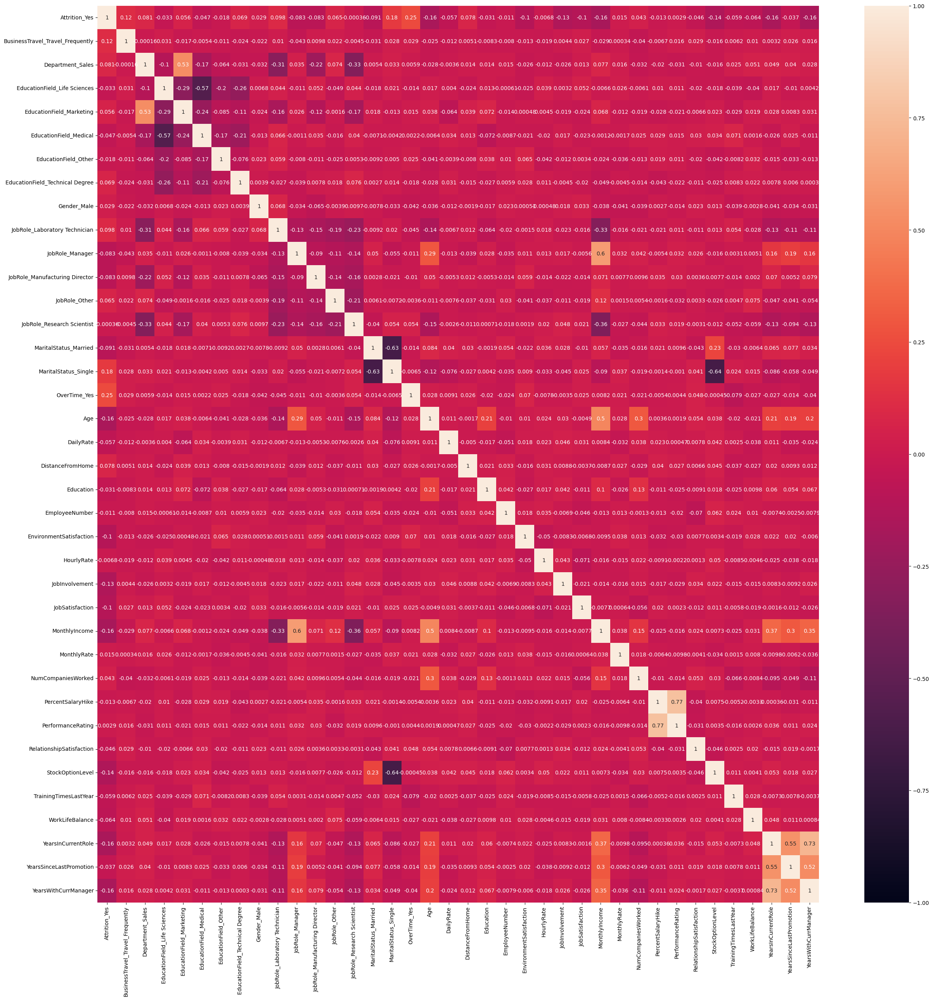

In [101]:
# Now check heatmap of data again:

plt.figure(figsize = (30,30))
sns.heatmap(data.corr(), vmin = -1, vmax = 1, annot = True);

In [102]:
# As high correlation of 0.77 exists between 'PerformanceRating' and 'PercentSalaryHike', we will call VIF to decide which one to drop:

vif_data = pd.DataFrame()
vif_data['features'] = data.columns
vif_data['VIF'] = [variance_inflation_factor(data.values, i) for i in range(len(data.columns))]
vif_data

,features,VIF
0,Attrition_Yes,1.552605
1,BusinessTravel_Travel_Frequently,1.266667
2,Department_Sales,3.752988
3,EducationField_Life Sciences,23.038086
4,EducationField_Marketing,7.541105
5,EducationField_Medical,17.722290
6,EducationField_Other,3.941112
7,EducationField_Technical Degree,5.817768
8,Gender_Male,2.549183
9,JobRole_Laboratory Technician,3.263081


In [103]:
# As VIF of 'PerformanceRating' (138) > VIF of 'PercentSalaryHike' (43), we will drop 'PerformanceRating':

data.drop(['PerformanceRating'], axis = 1, inplace = True)

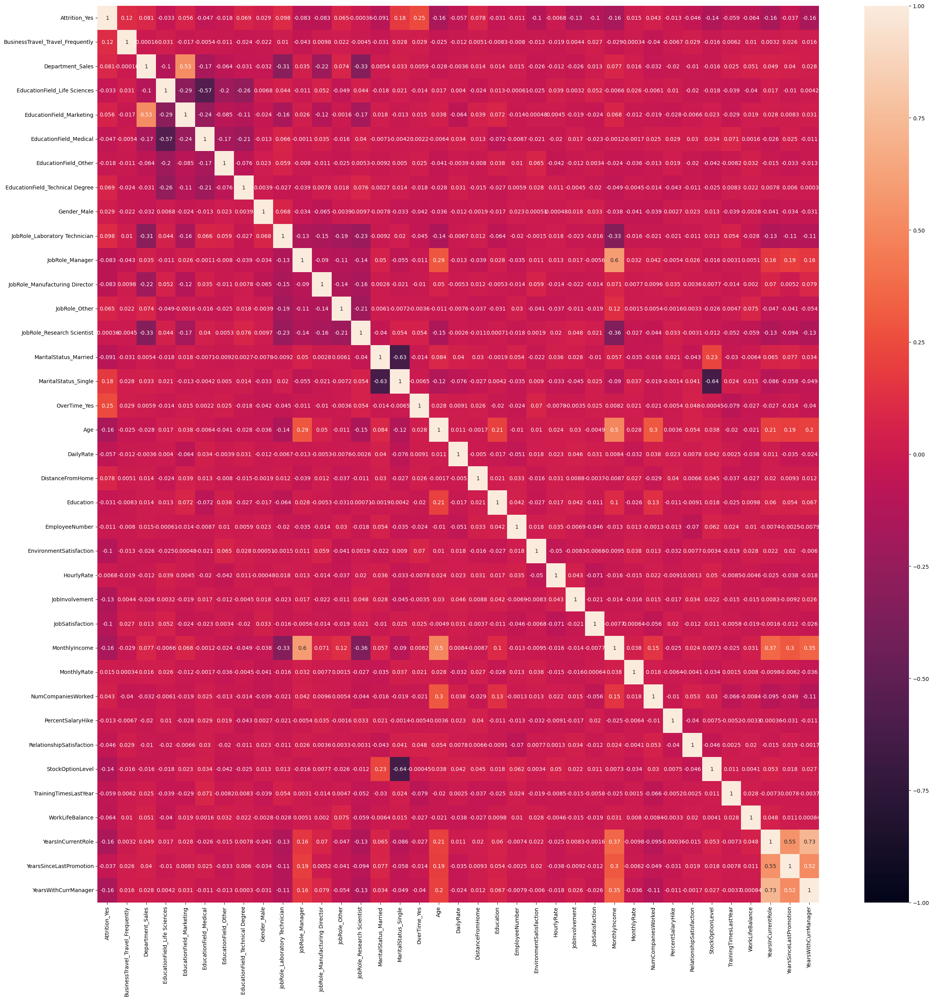

In [104]:
# Now check heatmap of data again:

plt.figure(figsize = (30,30))
sns.heatmap(data.corr(), vmin = -1, vmax = 1, annot = True);

In [105]:
print('As none of the columns have high correlation (0.75+), we can go ahead with our further analysis.')

As none of the columns have high correlation (0.75+), we can go ahead with our further analysis.


# Decision Tree and Random Forrest

In [106]:
x = data.drop(['Attrition_Yes'], axis = 1)
y = data['Attrition_Yes']

In [107]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

In [108]:
x_train, x_test, y_train, y_test = train_test_split(x, y, train_size = 0.7, random_state = 8)
dt = DecisionTreeClassifier(max_depth = 3)
dt.fit(x_train, y_train)
y_pred = dt.predict(x_test)
accuracy_score(y_test, y_pred)

0.8526077097505669

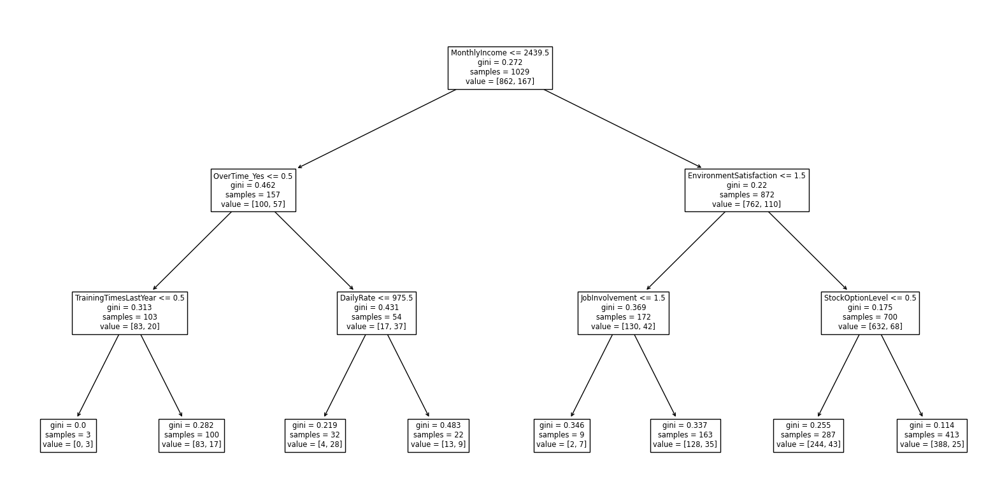

In [109]:
from sklearn import tree
plt.figure(figsize = (20, 10))
tree.plot_tree(dt, feature_names = x_train.columns.values);
# plt.savefig('sampleTree.jpeg)

In [110]:
from sklearn import *
rf = ensemble.RandomForestClassifier()

In [111]:
rf.fit(x_train, y_train)
y_pred_test = rf.predict(x_test)
y_pred_train = rf.predict(x_train)
print("Accuracy:", accuracy_score(y_test, y_pred_test))
print("Accuracy:", accuracy_score(y_train, y_pred_train))

Accuracy: 0.8458049886621315
Accuracy: 1.0


In [112]:
y_pred_test

array([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

# GridSearchCV and RandomSearchCV

In [113]:
param = {'n_estimators':[140, 145, 150, 155, 160],
         'max_leaf_nodes':range(10,20),
         'criterion':['gini', 'entropy', 'log_loss'],
         'max_depth': range(1,10)}


In [114]:
rf = ensemble.RandomForestClassifier(random_state = 15)

In [115]:
# Grid Search searches through all possible combination of hyperparameters. Hence it takes long time.

# from sklearn.model_selection import GridSearchCV
# gs = GridSearchCV(rf,param,cv = 3)
# gs_result = gs.fit(x_train, y_train)

In [116]:
# Random Search uses random sampling and is faster process than Grid Search.

from sklearn.model_selection import RandomizedSearchCV
Rlf = RandomizedSearchCV(rf, param)
Rlf.fit(x_train, y_train)
print(Rlf.best_params_)
print(Rlf.best_score_)

{'n_estimators': 140, 'max_leaf_nodes': 14, 'max_depth': 8, 'criterion': 'entropy'}
0.8454889888704713


In [117]:
import graphviz
from six import StringIO
from IPython.display import Image
import pydotplus
import pydot
from sklearn.tree import export_graphviz

In [118]:
dot_data = StringIO()
export_graphviz(dt, out_file = dot_data,
                filled = True, rounded = True,
                special_characters = True)
graph = pydotplus.graphviz.graph_from_dot_data(dot_data.getvalue())

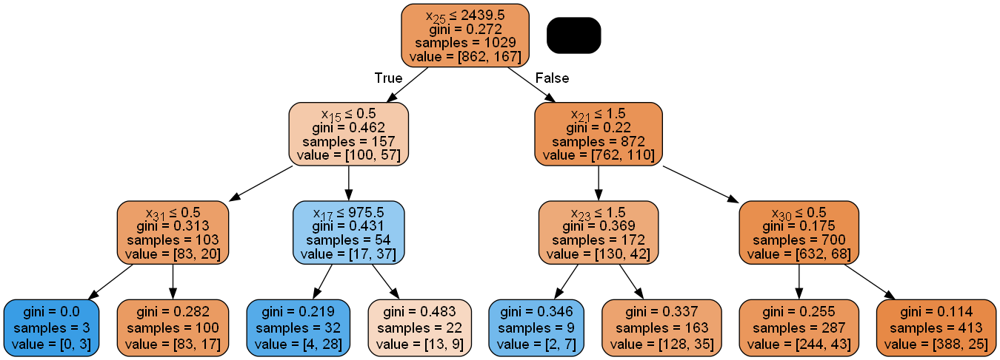

In [119]:
Image(graph.create_png())

In [120]:
from sklearn.ensemble import ExtraTreesClassifier
model = ExtraTreesClassifier()
model.fit(x,y)

ExtraTreesClassifier()

In [121]:
# Feat_Importances show the importance of each feature in the model

feat_importances = pd.Series(model.feature_importances_, index = x.columns)
feat_importances

BusinessTravel_Travel_Frequently    0.024437
Department_Sales                    0.019463
EducationField_Life Sciences        0.017195
EducationField_Marketing            0.012189
EducationField_Medical              0.018070
EducationField_Other                0.007441
EducationField_Technical Degree     0.013757
Gender_Male                         0.022449
JobRole_Laboratory Technician       0.020203
JobRole_Manager                     0.005022
JobRole_Manufacturing Director      0.009328
JobRole_Other                       0.017348
JobRole_Research Scientist          0.013491
MaritalStatus_Married               0.015206
MaritalStatus_Single                0.029659
OverTime_Yes                        0.068263
Age                                 0.047500
DailyRate                           0.033940
DistanceFromHome                    0.037047
Education                           0.028084
EmployeeNumber                      0.030735
EnvironmentSatisfaction             0.039535
HourlyRate

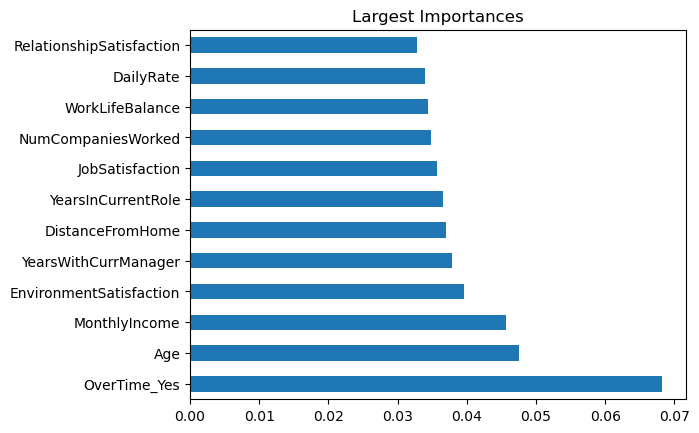

In [122]:
feat_importances.nlargest(12).plot(kind = 'barh');
plt.title('Largest Importances');

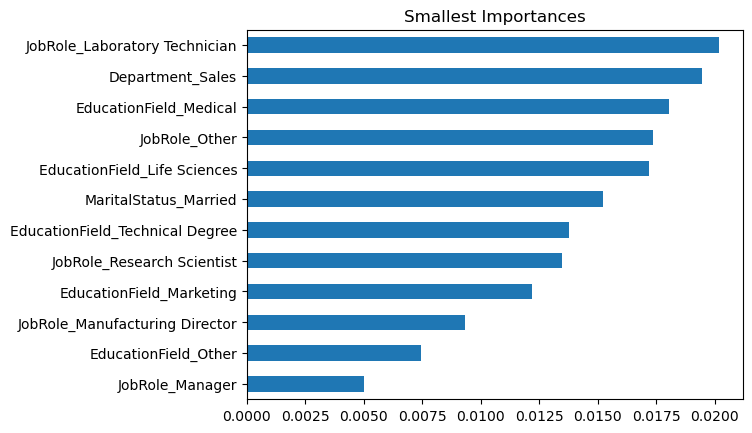

In [123]:
feat_importances.nsmallest(12).plot(kind = 'barh');
plt.title('Smallest Importances');